# Multimedia HW2

# Ali Babaloo - 9823012

## Question 1



### importing Libraries

In [182]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import seaborn as sb

### Loading Picture

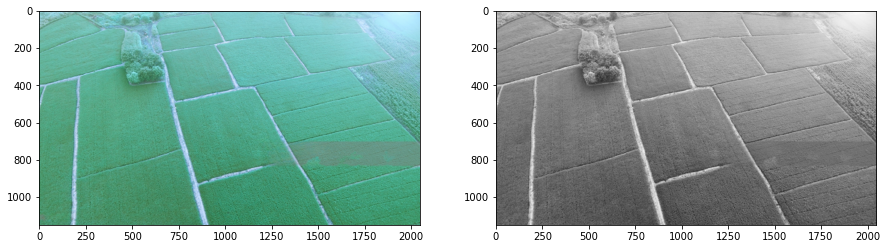

In [183]:
# read the input image
img = cv2.imread("./assets/AerialView.jpeg")

# convert the input image to grayscale image
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

fig, ax = plt.subplots(1, 2, figsize=(15, 10))
ax[0].imshow(img)
ax[1].imshow(gray, cmap = 'gray')

### Line Detection Using HoughLines()

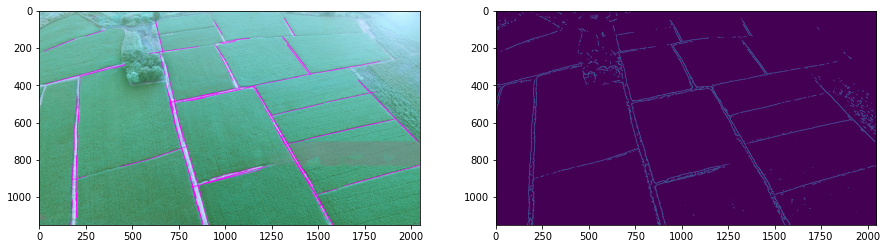

In [184]:
img2 = img.copy()
# find the edges using Canny edge detector
# edges = cv2.Canny(gray,50,100,apertureSize = 3)

# Remove noise by blurring with a Gaussian filter
# gaussian = cv2.GaussianBlur(gray,(11,11),0)
bilateral = cv2.bilateralFilter(img,11,175,200)

# find the edges using Canny edge detector
# edges = cv2.Canny(gaussian,65,70)
edges = cv2.Canny(bilateral,65,65)

# apply probabilistic Hough transform
lines = cv2.HoughLinesP(
            edges,           # Input edge image
            1,               # Distance resolution in pixels
            np.pi/180,       # Angle resolution in radians
            threshold=65,   # Min number of votes for valid line
            minLineLength=55, # Min allowed length of line
            maxLineGap=35    # Max allowed gap between line for joining them
            )

for line in lines:
    for x1,y1,x2,y2 in line:
        cv2.line(img2,(x1,y1),(x2,y2),(255,0,255),2)

fig, ax = plt.subplots(1, 2, figsize=(15, 10))
ax[0].imshow(img2)
ax[1].imshow(edges)

cv2.imshow('houghlines.jpg',img2)
cv2.imshow('edges', edges)
cv2.waitKey(0)
cv2.destroyAllWindows()

### Contour Detection

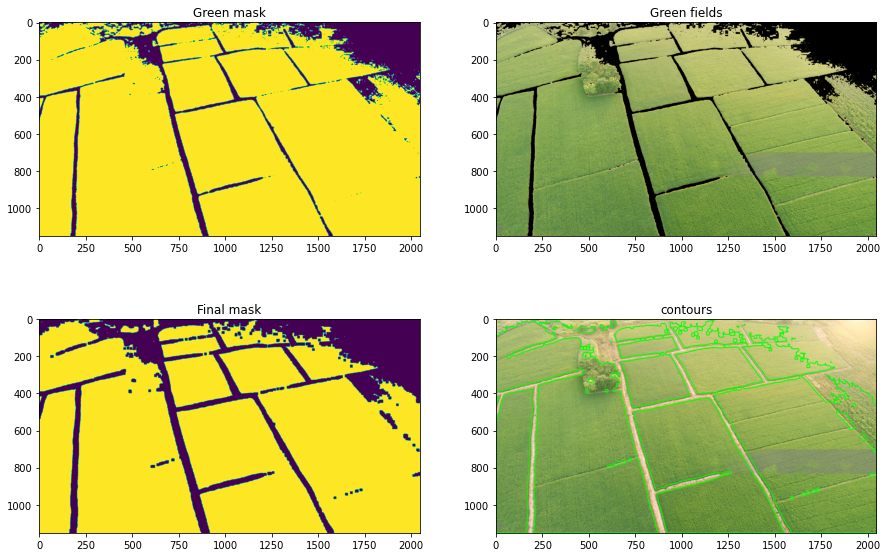

In [185]:
pic = cv2.imread("./assets/AerialView.jpeg")
# pyplot.imshow(cv.cvtColor(pic, cv.COLOR_BGR2RGB))
# pyplot.show()

hsv = cv2.cvtColor(pic, cv2.COLOR_BGR2HSV)

lower_green = np.array([29, 0, 0])
upper_green = np.array([180, 255, 255])

fig, ax = plt.subplots(2, 2, figsize=(15, 10))


mask = cv2.inRange(hsv, lower_green, upper_green)
res = cv2.bitwise_and(pic, pic, mask= mask)

ax[0,0].imshow(mask)
ax[0,0].set_title("Green mask")

ax[0,1].imshow(cv2.cvtColor(res, cv2.COLOR_BGR2RGB))
ax[0,1].set_title("Green fields")

# kernel = np.ones((15,15),np.uint8)
# mask = cv2.morphologyEx(mask, cv2.MORPH_GRADIENT, kernel)

kernel = np.ones((5,5),np.uint8)
mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)

kernel = np.ones((13,13),np.uint8)
mask = cv2.erode(mask,kernel,iterations = 1)


kernel = np.ones((5,5),np.uint8)
mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)


# plt.imshow(mask)
# plt.show()
ax[1,0].imshow(mask)
ax[1,0].set_title("Final mask")


contours, hierarchy = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

picc = pic.copy()
cv2.drawContours(picc, contours, -1, (0,255,0), 3)
# plt.imshow(cv2.cvtColor(picc, cv2.COLOR_BGR2RGB))
# plt.show()
ax[1,1].imshow(cv2.cvtColor(picc, cv2.COLOR_BGR2RGB))
ax[1,1].set_title("contours")



cv2.imshow('pic',picc)
cv2.imshow('edges', mask)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [186]:
area =[]
for cnt in contours:
    area.append(cv2.contourArea(cnt))
    
area.sort(reverse=True)
np.asanyarray(area)

array([6.862945e+05, 5.921125e+05, 3.612575e+05, 1.317135e+05,
       1.118785e+05, 3.693000e+03, 3.456000e+03, 2.607500e+03,
       1.406500e+03, 1.193000e+03, 1.031500e+03, 1.026500e+03,
       9.850000e+02, 8.915000e+02, 8.280000e+02, 8.190000e+02,
       7.460000e+02, 6.705000e+02, 6.435000e+02, 5.450000e+02,
       5.240000e+02, 4.860000e+02, 4.260000e+02, 4.080000e+02,
       4.030000e+02, 3.960000e+02, 3.775000e+02, 3.575000e+02,
       3.370000e+02, 3.205000e+02, 3.170000e+02, 3.160000e+02,
       2.835000e+02, 2.820000e+02, 2.775000e+02, 2.515000e+02,
       2.500000e+02, 2.500000e+02, 2.475000e+02, 2.460000e+02,
       2.380000e+02, 2.365000e+02, 2.365000e+02, 2.230000e+02,
       2.230000e+02, 2.230000e+02, 2.230000e+02, 2.215000e+02,
       2.215000e+02, 2.215000e+02, 2.080000e+02, 2.080000e+02,
       2.080000e+02, 2.080000e+02, 1.940000e+02, 1.940000e+02,
       1.940000e+02, 1.940000e+02, 1.940000e+02, 1.560000e+02,
       9.900000e+01, 7.350000e+01, 4.550000e+01, 3.7500

In [187]:
area

[686294.5,
 592112.5,
 361257.5,
 131713.5,
 111878.5,
 3693.0,
 3456.0,
 2607.5,
 1406.5,
 1193.0,
 1031.5,
 1026.5,
 985.0,
 891.5,
 828.0,
 819.0,
 746.0,
 670.5,
 643.5,
 545.0,
 524.0,
 486.0,
 426.0,
 408.0,
 403.0,
 396.0,
 377.5,
 357.5,
 337.0,
 320.5,
 317.0,
 316.0,
 283.5,
 282.0,
 277.5,
 251.5,
 250.0,
 250.0,
 247.5,
 246.0,
 238.0,
 236.5,
 236.5,
 223.0,
 223.0,
 223.0,
 223.0,
 221.5,
 221.5,
 221.5,
 208.0,
 208.0,
 208.0,
 208.0,
 194.0,
 194.0,
 194.0,
 194.0,
 194.0,
 156.0,
 99.0,
 73.5,
 45.5,
 37.5,
 21.0,
 11.5,
 11.0,
 9.0,
 8.5,
 6.0,
 3.5,
 3.0,
 1.5,
 1.0,
 0.0,
 0.0,
 0.0,
 0.0]

## Question 2

### importing Libraries

In [188]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import seaborn as sb

###  Loading Picture

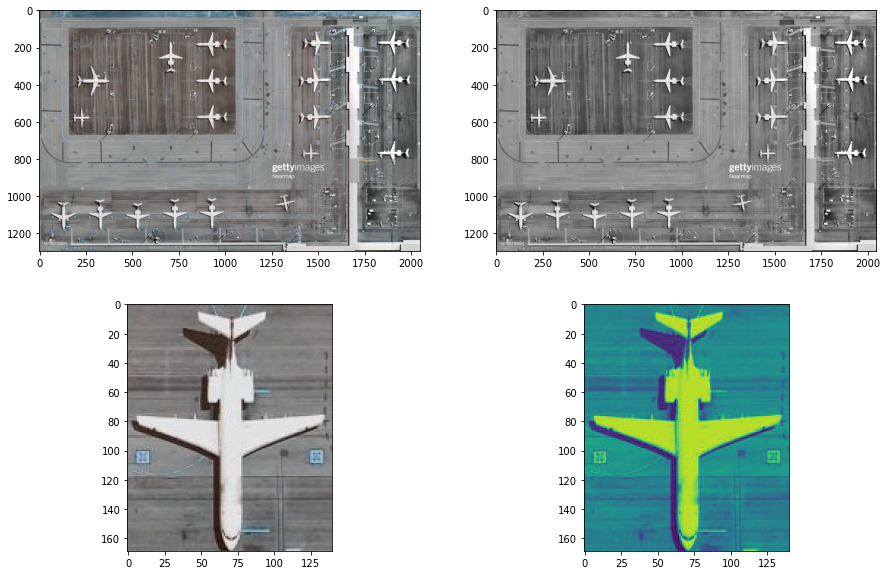

In [189]:
# read the input image
img = cv2.imread("./assets/airport.jpg")
template = cv2.imread('./assets/template_airplane1.jpg')

# convert the input image to grayscale image
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
gray_temp = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)

fig, ax = plt.subplots(2, 2, figsize=(15, 10))
ax[0,0].imshow(img)
ax[0,1].imshow(gray, cmap = 'gray')
ax[1,0].imshow(template)
ax[1,1].imshow(gray_temp)

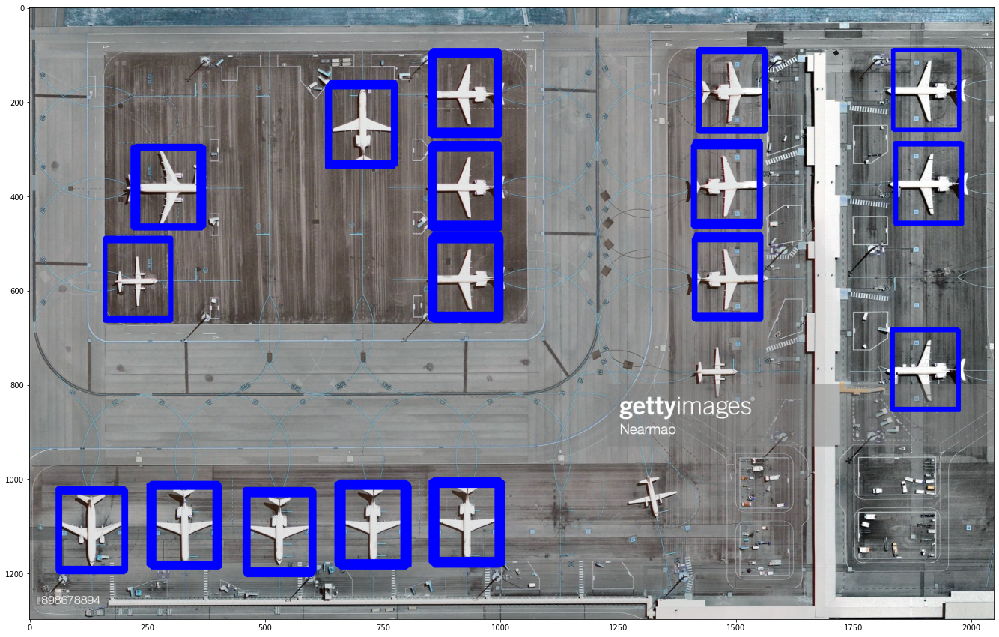

In [190]:
img2 = img.copy()
_, w, h = template.shape[::-1]

res = cv2.matchTemplate(gray,gray_temp,cv2.TM_CCOEFF_NORMED)
threshold = 0.36
loc = np.where( res >= threshold)
for pt in zip(*loc[::-1]):
    cv2.rectangle(img2, pt, (pt[0] + w, pt[1] + h), (0,0,255), 2)

fig, ax = plt.subplots(1, 1, figsize=(25, 15))

ax.imshow(img2)
cv2.imshow('template matching', img2)
cv2.waitKey(0)
cv2.destroyAllWindows()

## Question 3

### importing Libraries

In [191]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import seaborn as sb

###  Loading Picture

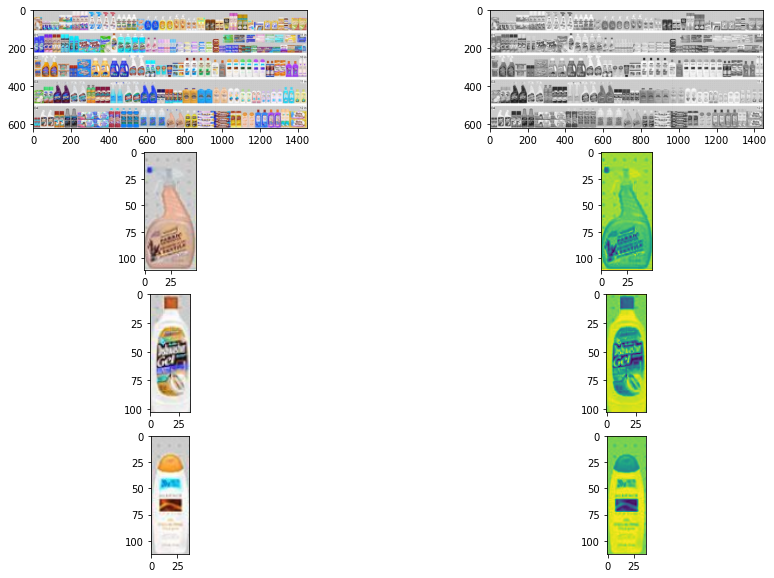

In [192]:
# read the input image
img = cv2.imread("./assets/rack.png.")
template1 = cv2.imread('./assets/sample1.png')
template2 = cv2.imread('./assets/sample2.png')
template3 = cv2.imread('./assets/sample3.png')

# convert the input image to grayscale image
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
gray_temp1 = cv2.cvtColor(template1, cv2.COLOR_BGR2GRAY)
gray_temp2 = cv2.cvtColor(template2, cv2.COLOR_BGR2GRAY)
gray_temp3 = cv2.cvtColor(template3, cv2.COLOR_BGR2GRAY)


fig, ax = plt.subplots(4, 2, figsize=(15, 10))
ax[0,0].imshow(img)
ax[0,1].imshow(gray, cmap = 'gray')
ax[1,0].imshow(template1)
ax[1,1].imshow(gray_temp1)
ax[2,0].imshow(template2)
ax[2,1].imshow(gray_temp2)
ax[3,0].imshow(template3)
ax[3,1].imshow(gray_temp3)

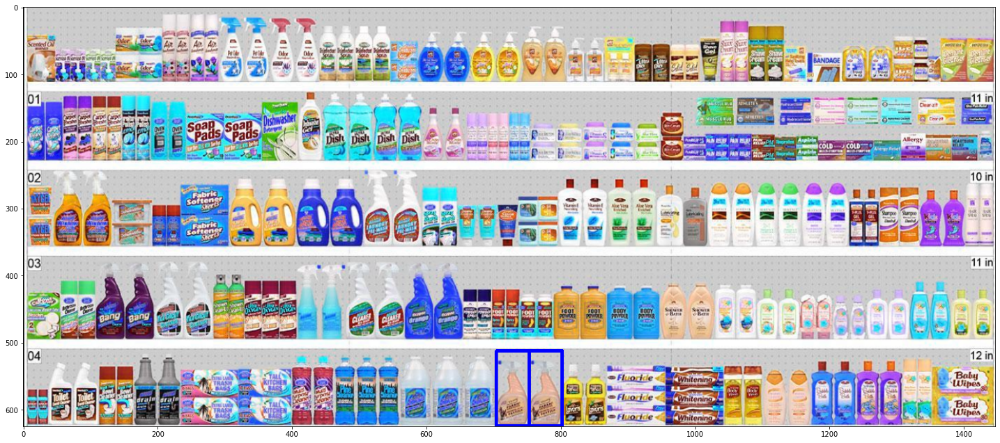

In [193]:
img2 = img.copy()
_, w, h = template1.shape[::-1]

res = cv2.matchTemplate(gray,gray_temp1,cv2.TM_CCOEFF_NORMED)
threshold = 0.8
loc = np.where( res >= threshold)
for pt in zip(*loc[::-1]):
    cv2.rectangle(img2, pt, (pt[0] + w, pt[1] + h), (0,0,255), 2)

fig, ax = plt.subplots(1, 1, figsize=(25, 15))

ax.imshow(img2)
cv2.imshow('template matching', img2)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [194]:
lst = [(i,j) for i,j in zip(loc[0],loc[1])]

def overlaps(C1, C2, eps):
    return all(abs(c2 - c1) < eps for c2, c1 in zip(C2, C1))

loc = np.where( res >= threshold)
lst = [(i,j) for i,j in zip(loc[0],loc[1])]
eps = 20
new_lst = set()
while lst:
    circle = lst.pop()
    for other in lst:
        if overlaps(circle, other, eps):
            break
    else:
        new_lst.add(circle)
new_lst
print('Number of exicted Sample item 1 in rack is equal to = {0}\n\n'.format(len(new_lst)))

Number of exicted Sample item 1 in rack is equal to = 2




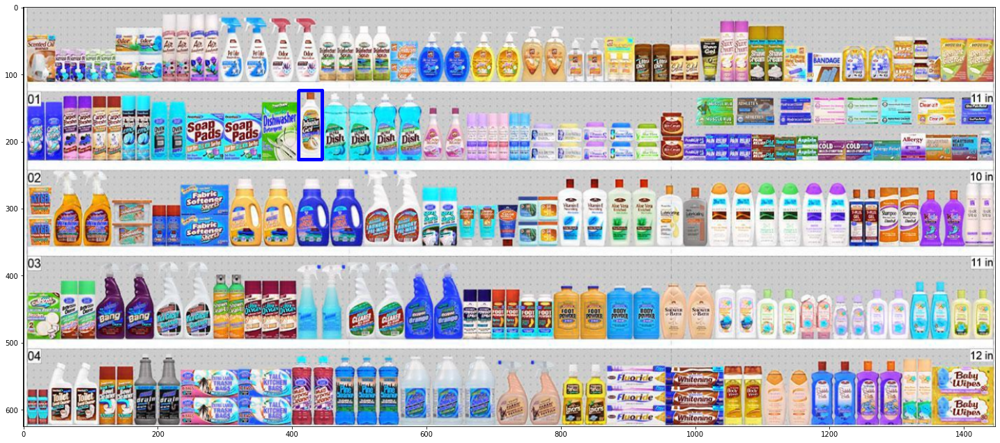

In [195]:
img3 = img.copy()
_, w, h = template2.shape[::-1]

res = cv2.matchTemplate(gray,gray_temp2,cv2.TM_CCOEFF_NORMED)
threshold = 0.8
loc = np.where( res >= threshold)
for pt in zip(*loc[::-1]):
    cv2.rectangle(img3, pt, (pt[0] + w, pt[1] + h), (0,0,255), 2)

fig, ax = plt.subplots(1, 1, figsize=(25, 15))

ax.imshow(img3)
cv2.imshow('template matching', img3)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [196]:
lst = [(i,j) for i,j in zip(loc[0],loc[1])]

def overlaps(C1, C2, eps):
    return all(abs(c2 - c1) < eps for c2, c1 in zip(C2, C1))

loc = np.where( res >= threshold)
lst = [(i,j) for i,j in zip(loc[0],loc[1])]
eps = 20
new_lst = set()
while lst:
    circle = lst.pop()
    for other in lst:
        if overlaps(circle, other, eps):
            break
    else:
        new_lst.add(circle)
new_lst
print('Number of exicted Sample item 2 in rack is equal to = {0}\n\n'.format(len(new_lst)))

Number of exicted Sample item 2 in rack is equal to = 1




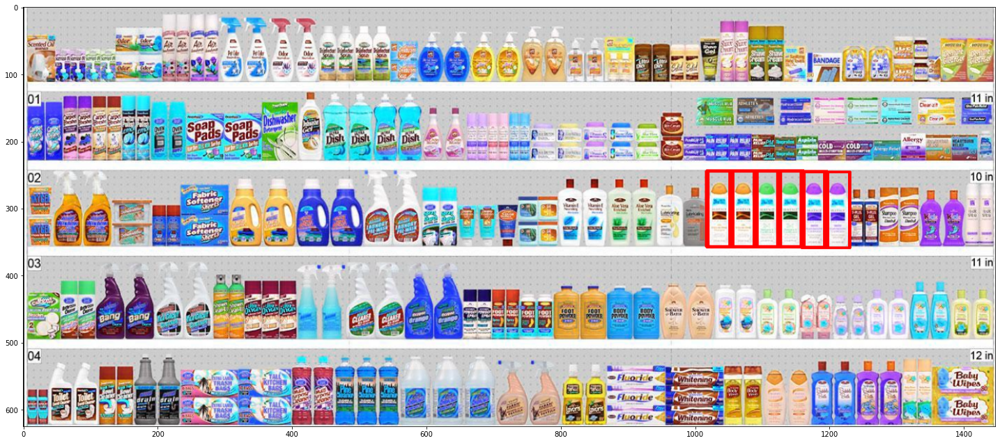

In [197]:
img4 = img.copy()
_, w, h = template3.shape[::-1]

res = cv2.matchTemplate(gray,gray_temp3,cv2.TM_CCOEFF_NORMED)
threshold = 0.8
loc = np.where( res >= threshold)
for pt in zip(*loc[::-1]):
    cv2.rectangle(img4, pt, (pt[0] + w, pt[1] + h), (255,0,0), 2)

fig, ax = plt.subplots(1, 1, figsize=(25, 15))

ax.imshow(img4)
cv2.imshow('template matching', img4)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [198]:
lst = [(i,j) for i,j in zip(loc[0],loc[1])]

def overlaps(C1, C2, eps):
    return all(abs(c2 - c1) < eps for c2, c1 in zip(C2, C1))

loc = np.where( res >= threshold)
lst = [(i,j) for i,j in zip(loc[0],loc[1])]
eps = 20
new_lst = set()
while lst:
    circle = lst.pop()
    for other in lst:
        if overlaps(circle, other, eps):
            break
    else:
            new_lst.add(circle)
new_lst
print('Number of exicted Sample item 3 in rack is equal to = {0}\n\n'.format(len(new_lst)))

Number of exicted Sample item 3 in rack is equal to = 6


